In [1]:
from diffusers import StableDiffusionPipeline
import torch

In [3]:
from huggingface_hub import notebook_login

In [22]:
from PIL import Image

def image_grid(imgs, rows, cols):
    assert len(imgs) == rows * cols

    w, h = imgs[0].size
    grid = Image.new('RGB', size=(cols*w, rows*h))

    for i, img in enumerate(imgs):
        grid.paste(img, box=(i%cols*w, i//cols*h))

    return grid

In [6]:
checkpoint = "CompVis/stable-diffusion-v1-4"
pipe = StableDiffusionPipeline.from_pretrained(checkpoint, revision="fp16", torch_dtype=torch.float16)

/home/aman/miniconda3/lib/python3.11/site-packages/diffusers/pipelines/pipeline_loading_utils.py:212: FutureWarning: You are loading the variant fp16 from CompVis/stable-diffusion-v1-4 via `revision='fp16'` even though you can load it via `variant=`fp16`. Loading model variants via `revision='fp16'` is deprecated and will be removed in diffusers v1. Please use `variant='fp16'` instead.
  warnings.warn(
text_encoder/model.safetensors not found


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

/home/aman/miniconda3/lib/python3.11/site-packages/transformers/models/clip/feature_extraction_clip.py:28: FutureWarning: The class CLIPFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use CLIPImageProcessor instead.
  warnings.warn(


In [9]:
pipe = pipe.to("cuda")

In [23]:
prompts = ["a photo of a tiger playing cricket on the moon", "a photograph of an astronaut riding a horse"]
output = pipe(prompts)

  0%|          | 0/50 [00:00<?, ?it/s]

In [24]:
output

StableDiffusionPipelineOutput(images=[<PIL.Image.Image image mode=RGB size=512x512 at 0x7E4F44BFE150>, <PIL.Image.Image image mode=RGB size=512x512 at 0x7E4E14983B50>], nsfw_content_detected=[False, False])

In [25]:
output.images

[<PIL.Image.Image image mode=RGB size=512x512>,
 <PIL.Image.Image image mode=RGB size=512x512>]

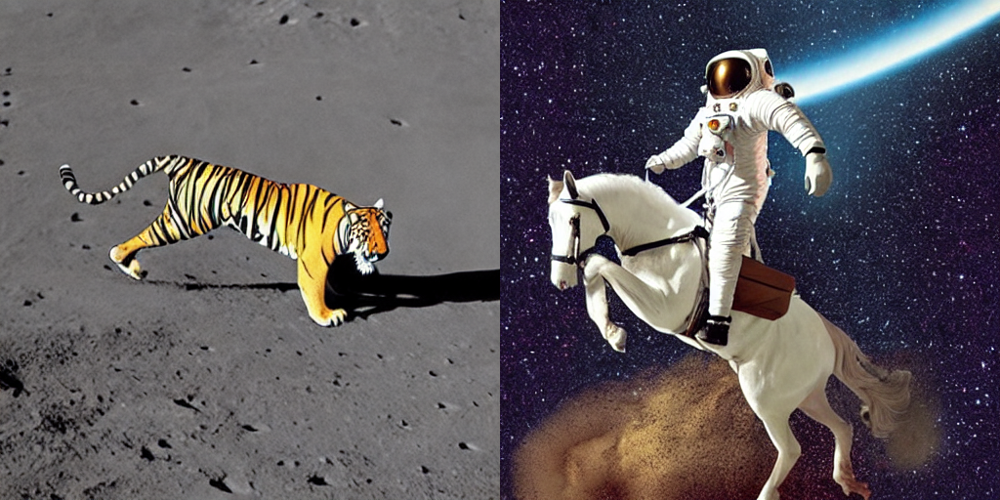

In [26]:
grid = image_grid(output.images, rows=1, cols=2)
grid

  0%|          | 0/50 [00:00<?, ?it/s]

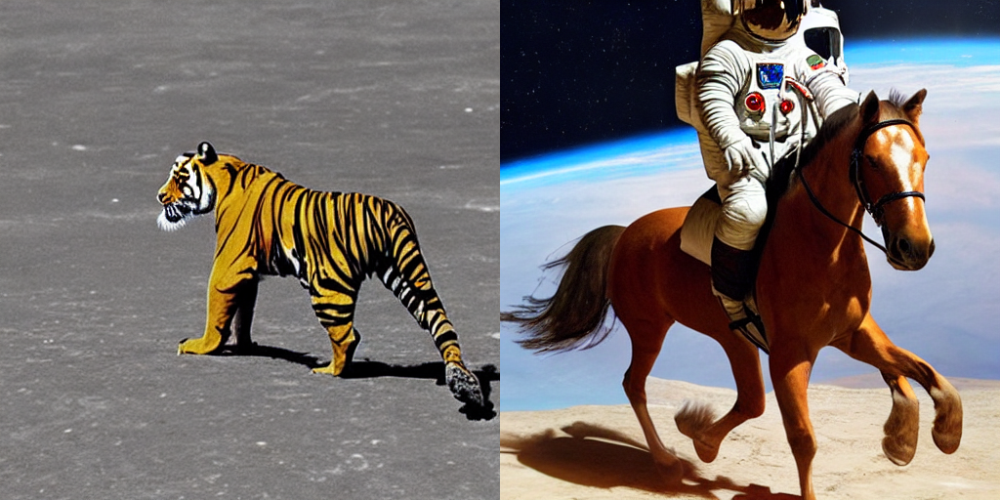

In [27]:
import torch

generator = torch.Generator("cuda").manual_seed(1024)
images = pipe(prompts, guidance_scale=7.5, generator=generator).images

image_grid(images, rows=1, cols=2)

  0%|          | 0/15 [00:00<?, ?it/s]

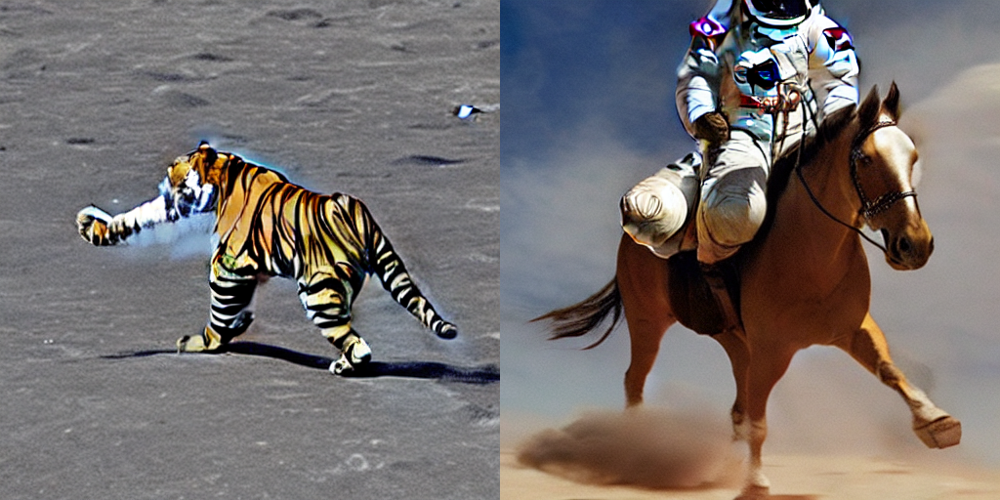

In [29]:
import torch

generator = torch.Generator("cuda").manual_seed(1024)
images = pipe(prompts, guidance_scale=7.5, num_inference_steps=15, generator=generator).images

image_grid(images, rows=1, cols=2)

  0%|          | 0/50 [00:00<?, ?it/s]

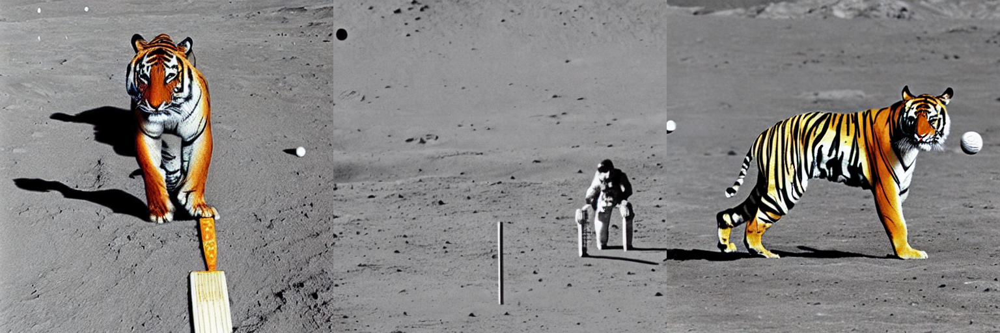

  0%|          | 0/50 [00:00<?, ?it/s]

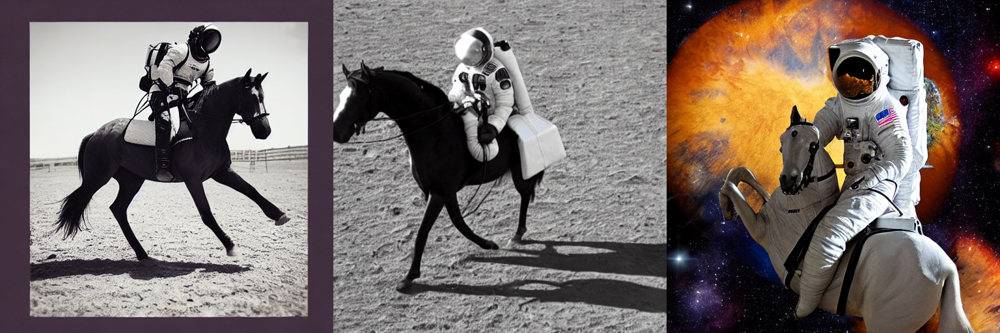

In [31]:
num_images = 3
for p in prompts:
    prompt = [p] * num_images
    images = pipe(prompt).images

    grid = image_grid(images, 1, 3)
    display(grid)

In [32]:
print(prompts)

['a photo of a tiger playing cricket on the moon', 'a photograph of an astronaut riding a horse']


  0%|          | 0/50 [00:00<?, ?it/s]

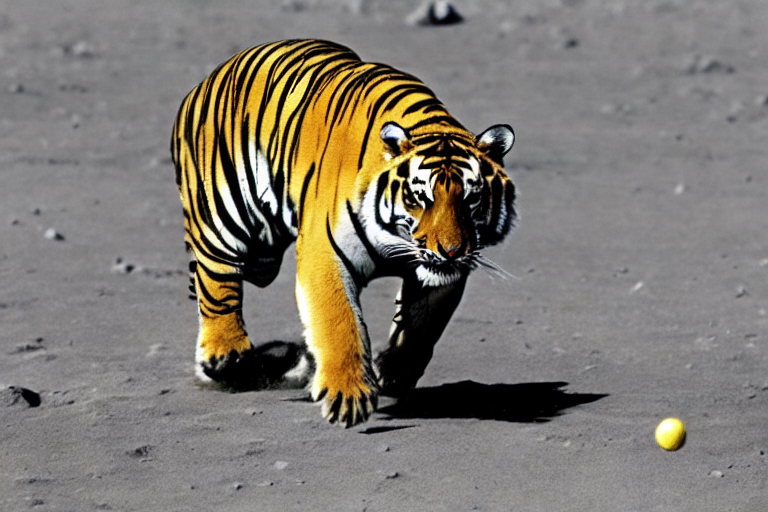

In [33]:
pipe(prompts[0], height=512, width=768).images[0]

  0%|          | 0/50 [00:00<?, ?it/s]

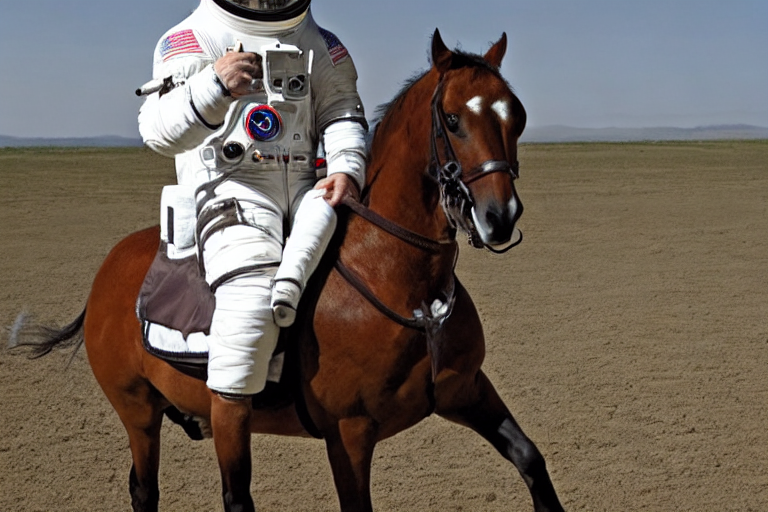

In [34]:
pipe(prompts[1], height=512, width=768).images[0]